# Satellite Image Analysis


_Loading the libraries we need: numpy, scipy, matplotlib_

In [1]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt


# Creating a numpy array from an image file


_Lets choose a WIFIRE satellite image file as an ndarray and display its type_


In [2]:
from skimage import data

photo_data = misc.imread('./wifire/sd-3layers.jpg')

type(photo_data)


C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


numpy.ndarray

Let's see what is in this image. 

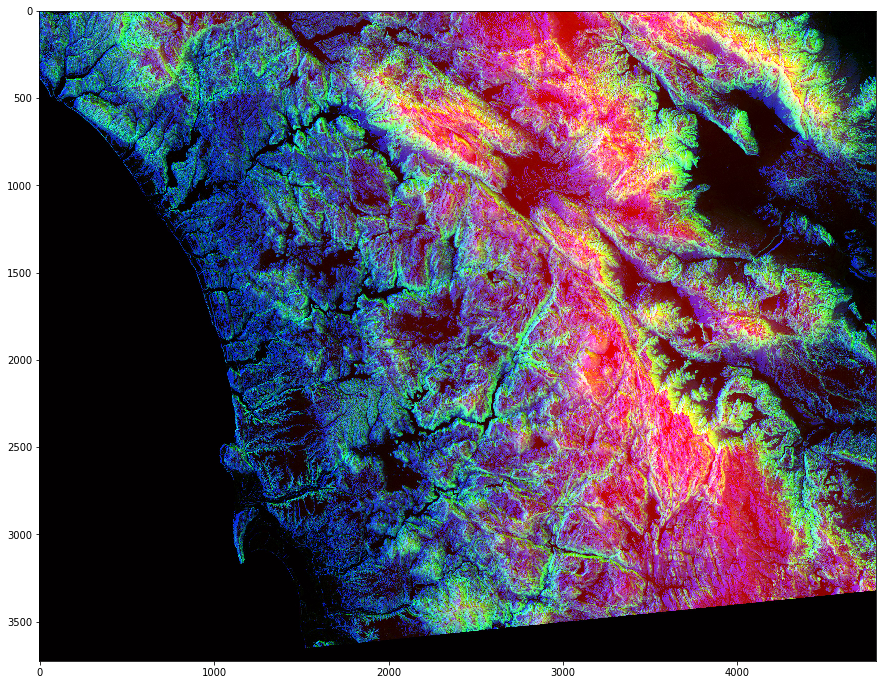

In [3]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [4]:
photo_data.shape

#print(photo_data)

(3725, 4797, 3)

__The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue._


_RGB Color Mapping in the Photo_


_RED pixel indicates Altitude_

_BLUE pixel indicates Aspect_


_GREEN pixel indicates Slope_
The higher values denote higher altitude, aspect and slope.


In [5]:
photo_data.size

53606475

In [6]:
photo_data.min(), photo_data.max()

(0, 255)

In [7]:
photo_data.mean()

75.8299354508947

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Pixel on the 150th Row and 250th Column</p>

In [8]:
photo_data[150, 250]

array([ 17,  35, 255], dtype=uint8)

In [9]:
photo_data[150, 250, 2]

255

the third element in the array indicates 0 for red, 1 for green, 2 for blue

__Doubt__(_cleared_)


__Set a Pixel to All Zeros__

We can set all three layer in a pixel as once by assigning zero globally to that (row,column) pairing. However, setting one pixel to zero is not noticeable.

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


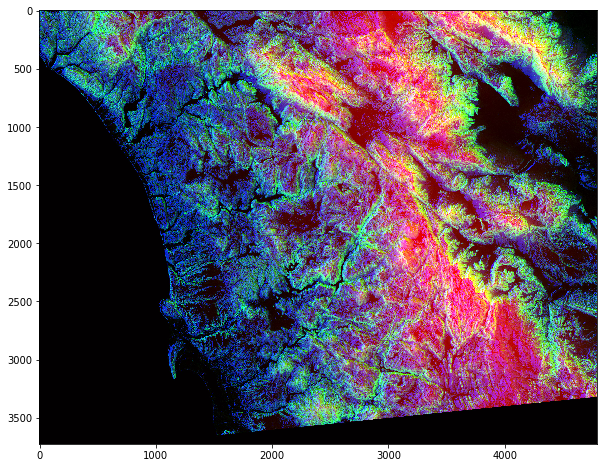

In [10]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[150, 250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)


__Changing colors in a Range__

_We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 t0 800 to full intensity._

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


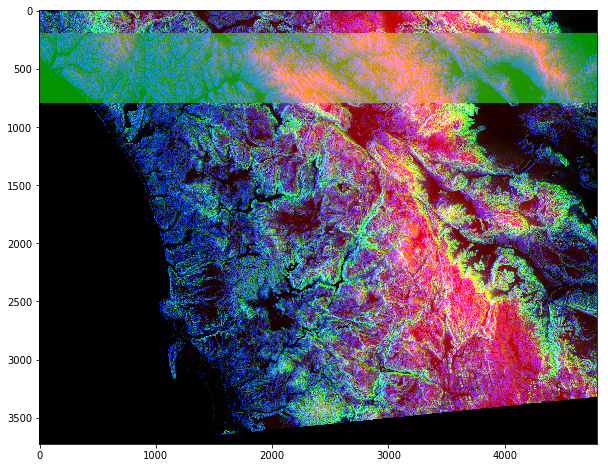

In [11]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800,: ,1] = 147
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

_the first part shows the rows, second shows the columns, and the third shows the RGB_(we can manipulate them easily)

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


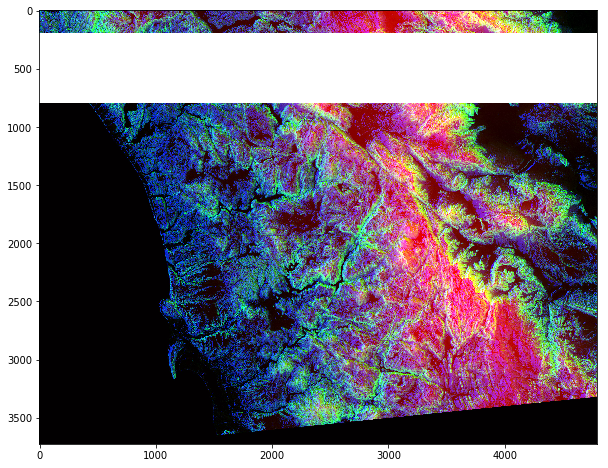

In [12]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, :] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


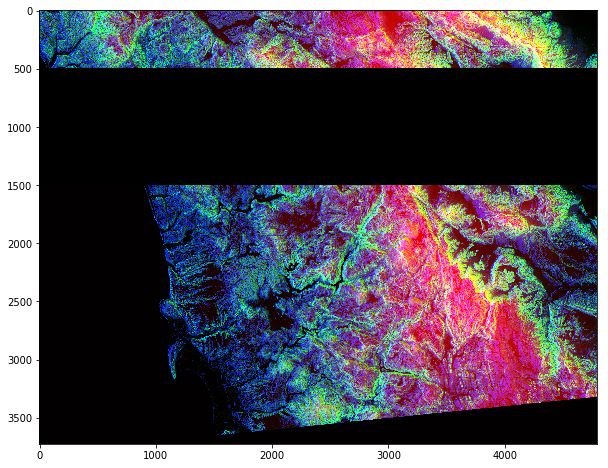

In [13]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[500:1500, :] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

__Changing color globally__


## Pick all Pixels with Low Values

In [14]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 20
0
print("Shape of low_value_filter:", low_value_filter.shape)

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)



## Filtering Out Low Values 
_Whenever the low-value-filter is True, set value to 0._

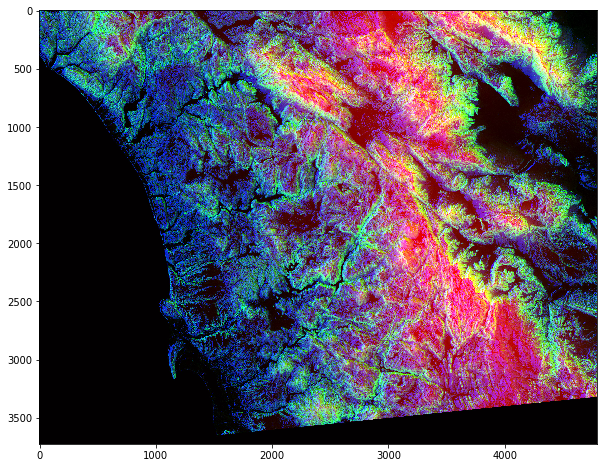

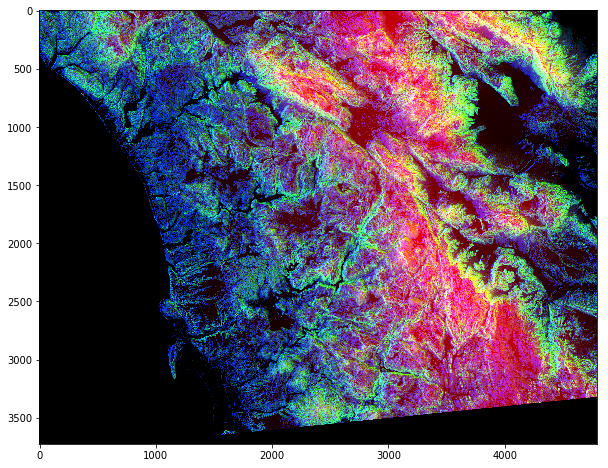

In [15]:
#import random
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)


## More Row and Column Operations.
_You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns._

In [16]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [17]:
photo_data[rows_range, cols_range] = 255

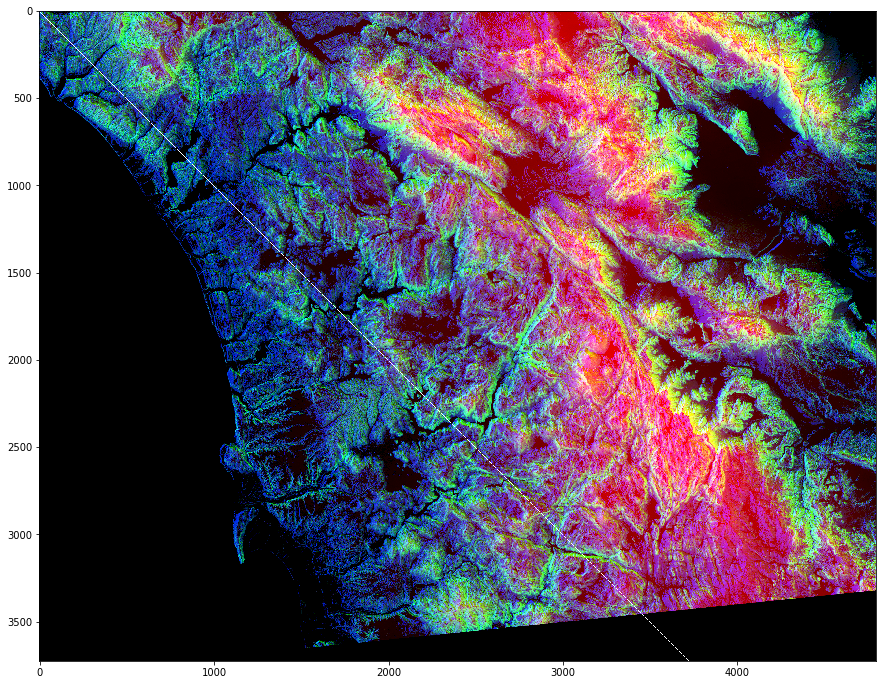

In [18]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)


## Masking Images
_Now let us try something even cooler...a mask that is in shape of a circular disc._

In [19]:

total_rows, total_cols, total_layers = photo_data.shape
print("photo_data = ", photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
print("X = ", X.shape, " and Y = ", Y.shape)

photo_data =  (3725, 4797, 3)
X =  (3725, 1)  and Y =  (1, 4797)


C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


Radius =  3468906.25
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


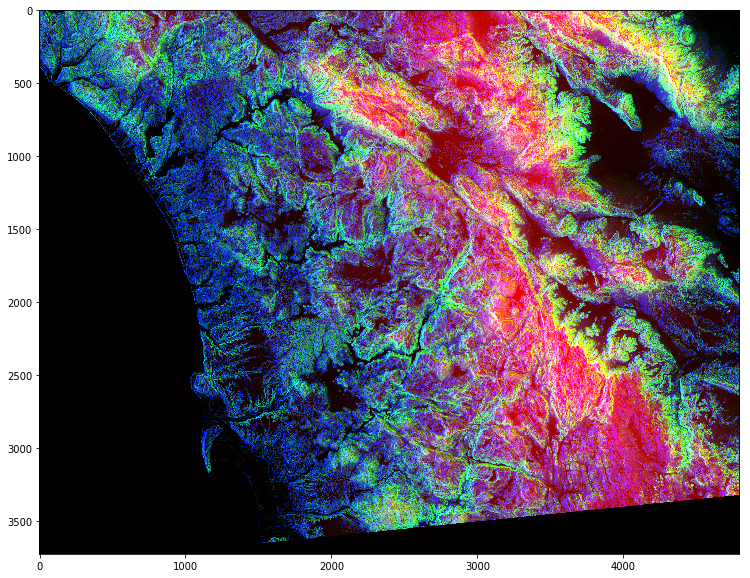

In [20]:
photo_data=misc.imread('./wifire/sd-3layers.jpg')

plt.figure(figsize=(17,10))
plt.imshow(photo_data)
center_row, center_col = total_rows / 2, total_cols / 2
#print("center_row = ", center_row, "AND center_col = ", center_col)
#print(X - center_row)
#print(Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
#print(dist_from_center)
radius = (total_rows / 2)**2

print("Radius = ", radius)
circular_mask = (dist_from_center > radius)
#print(circular_mask)
print(circular_mask[1500:1700,2000:2200])

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


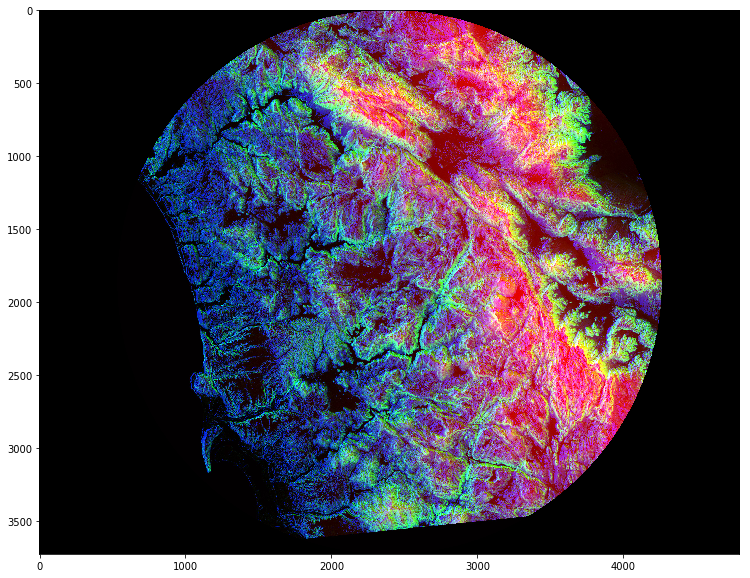

In [21]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize=(15,10))
plt.imshow(photo_data)


## Further Masking
_You can further improve the mask, for example just get upper half disc._

In [22]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_mask = np.logical_and(half_upper, circular_mask)

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


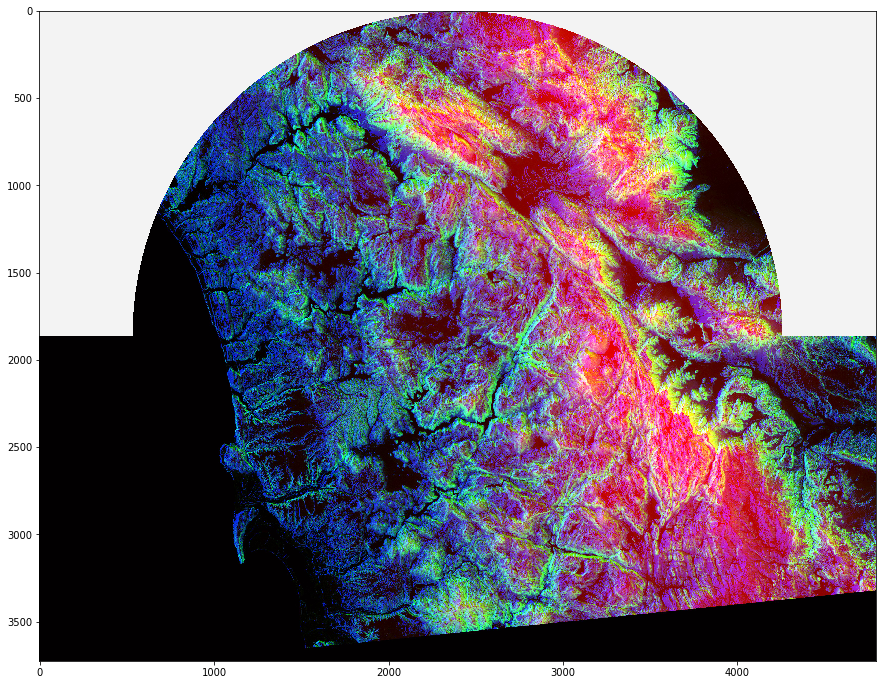

In [23]:
import random 
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[half_upper_mask] = 255
photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)


## Further Processing of our Satellite Imagery


__Processing of RED Pixels__

_Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas._

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


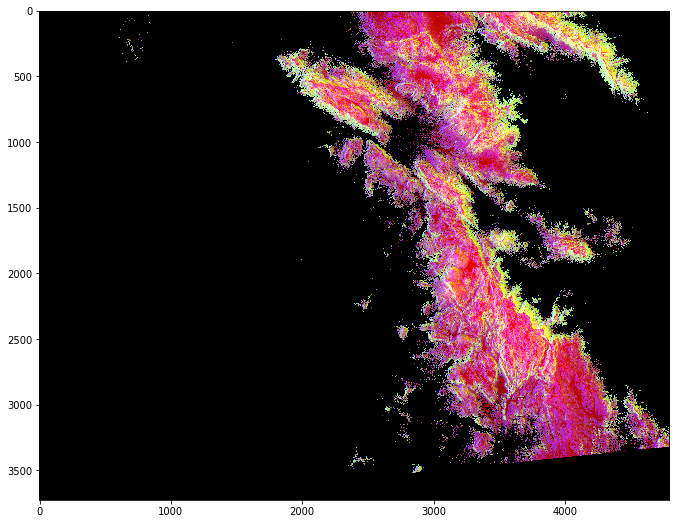

In [24]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
red_mask   = photo_data[:, : ,0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(13,9))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highl-GREEN Pixels</p>

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


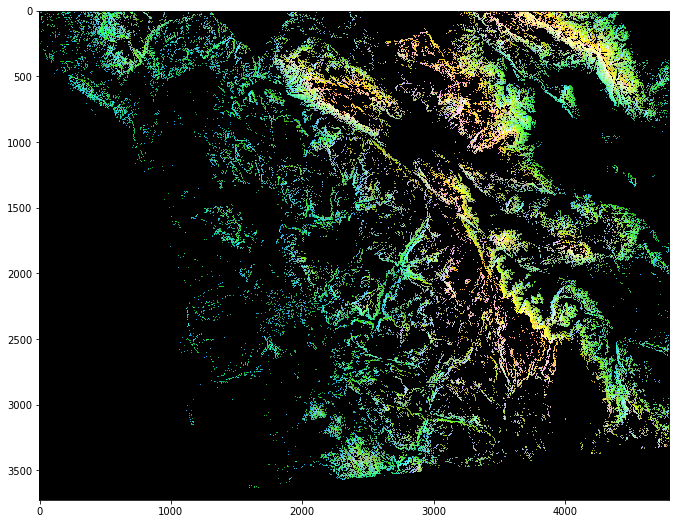

In [25]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
green_mask = photo_data[:, : ,1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(13,9))
plt.imshow(photo_data)


## Detecting Highly-BLUE Pixels

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


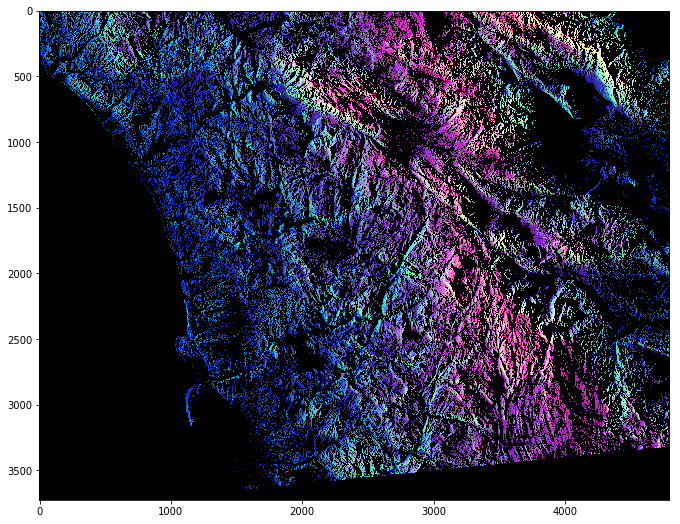

In [26]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
blue_mask  = photo_data[:, : ,2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,9))
plt.imshow(photo_data)



__Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE__

C:\Users\Asif Naseem\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


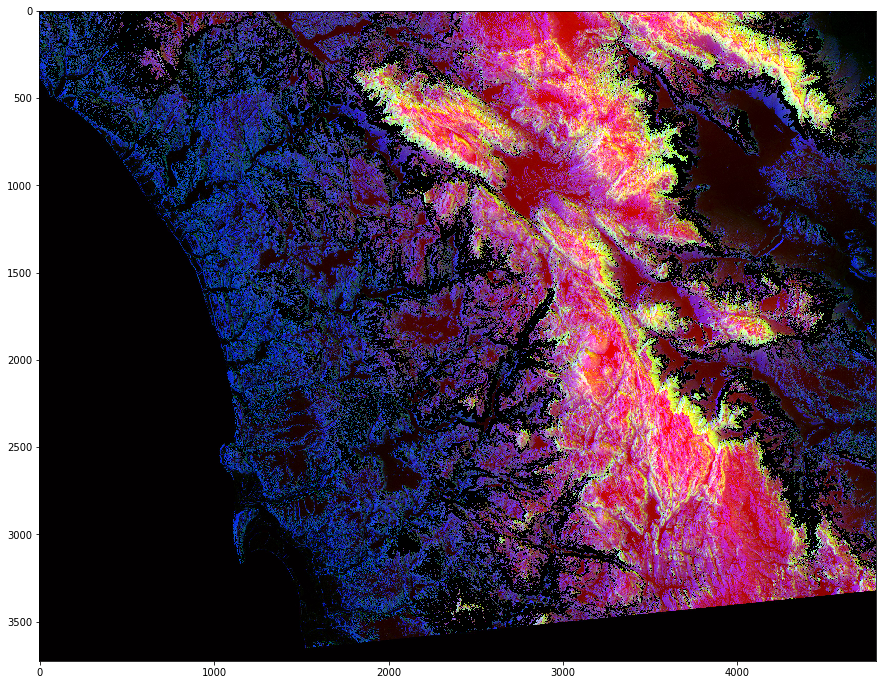

In [27]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

red_mask   = photo_data[:, : ,0] < 150
green_mask = photo_data[:, : ,1] > 100
blue_mask  = photo_data[:, : ,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)